In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


class TrafficSignDetector:
    def __init__(self, images_dir, train_images_dir):
        """
        Initialize the TrafficSignDetector with directories for images.

        :param images_dir: Path to the root image directory
        :param train_images_dir: Path to the training images subdirectory
        """
        self.images_dir = images_dir
        self.train_images_dir = train_images_dir

        # Placeholder for image dimensions and processing steps
        self.height = None
        self.width = None
        self.gray_image = None
        self.histofram_eq_image = None
        self.blurred_image = None
        self.thresholded_image = None
        self.edges = None
        self.eroded_image = None
        self.filtered_components = None
        self.output_image = None
        self.circles = None
        self.detected_plates = []

    def process_image(self, image_name):
        """
        Process an image through the detection pipeline.
        
        :param image_name: Filename of the image to process
        """
        # 1. Load and convert to grayscale
        image_path = os.path.join(self.images_dir, self.train_images_dir, image_name)
        self.gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        self.height, self.width = self.gray_image.shape
        

        # 2. Gaussian blur
        kernel_size = (self.width // 40, self.height // 40)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0] | 1), max(3, kernel_size[1] | 1))  # Ensure odd size
        self.blurred_image = cv2.GaussianBlur(self.gray_image, kernel_size, 0.)

        

        # 3. Thresholding
        self.thresholded_image = cv2.adaptiveThreshold(
                self.blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                cv2.THRESH_BINARY,
                19, 2
                )

        
        # 4. Edge detection

        #make self.edges the negatice of the self.thresholded_image
        self.edges = cv2.bitwise_not(self.thresholded_image)
        
        
        # Connected components analysis
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(self.edges, 8, cv2.CV_32S)
        self.connected_component_image = labels.copy()
        self.filtered_components = np.zeros(self.edges.shape, dtype=np.uint8)



        for i in range(1, num_labels):
            if stats[i, cv2.CC_STAT_AREA] > 1000 and 0.3 < stats[i, cv2.CC_STAT_WIDTH] / stats[i, cv2.CC_STAT_HEIGHT] < 3:
                # Extract the mask of the current component
                component_mask = (labels == i).astype(np.uint8)
                # Calculate moments
                moments = cv2.moments(component_mask)
                if moments["mu20"] + moments["mu02"] == 0:  # Avoid division by zero
                    continue
                # Calculate covariance matrix eigenvalues
                covariance_matrix = np.array([
                    [moments["mu20"], moments["mu11"]],
                    [moments["mu11"], moments["mu02"]]
                ])
                eigenvalues, _ = np.linalg.eig(covariance_matrix)
                eigenvalues = sorted(eigenvalues, reverse=True)  # Sort eigenvalues
                # Calculate eccentricity
                if eigenvalues[0] == 0:
                    eccentricity = 0
                else:
                    eccentricity = np.sqrt(1 - (eigenvalues[1] / eigenvalues[0]))
                #print("eccentricity", eccentricity)
                
                # Check if eccentricity is less than 0.9
                if eccentricity < 0.86:
                    self.filtered_components[labels == i] = 255

        # 5. Morphological operations
        kernel_size = (self.width // 100, self.height // 100)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0]), max(3, kernel_size[1]))  # Ensure minimum size
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
        dilated_image =   cv2.dilate(self.filtered_components, kernel, iterations=1)
        self.eroded_image = cv2.erode(dilated_image, kernel, iterations=1)


        # 6. Circle detection (Hough Transform)
        min_radius = min(self.height // 35, self.width // 35)  # Relative to image height
        #print(min_radius)
        max_radius = max(self.height // 2, self.width // 2)
        self.circles = cv2.HoughCircles(
            self.eroded_image,
            cv2.HOUGH_GRADIENT_ALT,
            dp=1,
            minDist=min(self.height // 20, self.width // 20),
            param1=20,
            param2=0.5,
            minRadius=min_radius,
            maxRadius=max_radius,
        )

        # 7. Remove overlapping circles
        self.remove_overlapping_circles()

        # 8. Draw detected circles and extract plates
        self.output_image = cv2.cvtColor(self.gray_image, cv2.COLOR_GRAY2BGR)
        if self.circles is not None:
            self.circles = np.uint16(np.around(self.circles))
            for circle in self.circles[0, :]:
                x, y, r = circle
                cv2.circle(self.output_image, (x, y), r, (0, 255, 0), 2)
                cropped_plate = self.gray_image[max(0, y - r) : min(self.height, y + r), max(0, x - r) : min(self.width, x + r)]
                self.detected_plates.append(cropped_plate)

    def remove_overlapping_circles(self, overlap_threshold=0.3):
        """
        Remove overlapping circles from the list based on a threshold.

        :param overlap_threshold: The minimum overlap ratio to consider two circles as overlapping
        """
        if self.circles is not None:
            valid_circles = []
            for i, circle1 in enumerate(self.circles[0, :]):
                x1, y1, r1 = circle1
                is_overlapping = False
                
                # If valid_circles is empty, we can add the first circle directly
                if len(valid_circles) == 0:
                    valid_circles.append(circle1)
                    continue
                
                for circle2 in valid_circles:
                    x2, y2, r2 = circle2
                    # Calculate distance between centers
                    distance = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)
                    #print(x1, y1, r1, x2, y2, r2, distance)
                    # Check if the circles overlap more than the threshold
                    #print(distance, (r1 + r2) * (1 - overlap_threshold))
                    if distance < (r1 + r2) * (1 - overlap_threshold):
                        is_overlapping = True
                        break

                if not is_overlapping:
                    valid_circles.append(circle1)
            
            # Update self.circles with the filtered non-overlapping circles
            self.circles = np.array([valid_circles], dtype=np.uint16)


    def visualize_results(self):
        """
        Visualize intermediate results and detected plates.
        """
        titles = [
            "Original Image",
            "Gaussian Blur",
            "Thresholded Image",
            "Edges",
            "Connected Components",
            "Filtered Components",
            "Morphological Image",
            "Detected Circles",
        ]
        images = [
            self.gray_image,
            self.blurred_image,
            self.thresholded_image,
            self.edges,
            self.connected_component_image,
            self.filtered_components ,
            self.eroded_image,
            self.output_image,
        ]

        plt.figure(figsize=(20, 10))
        for i, (title, img) in enumerate(zip(titles, images), 1):
            if img is not None:
                plt.subplot(2, 4, i)
                plt.title(title)
                cmap = "gray" if len(img.shape) == 2 else None
                plt.imshow(img, cmap=cmap)
                #plt.axis("off")

        # Visualize detected plates
        for i, plate in enumerate(self.detected_plates, 1):
            plt.figure(figsize=(5, 5))
            plt.title(f"Detected Plate {i}")
            plt.imshow(plate, cmap="gray")
            #plt.axis("off")
            plt.show()

        plt.tight_layout()
        plt.show()


# Train

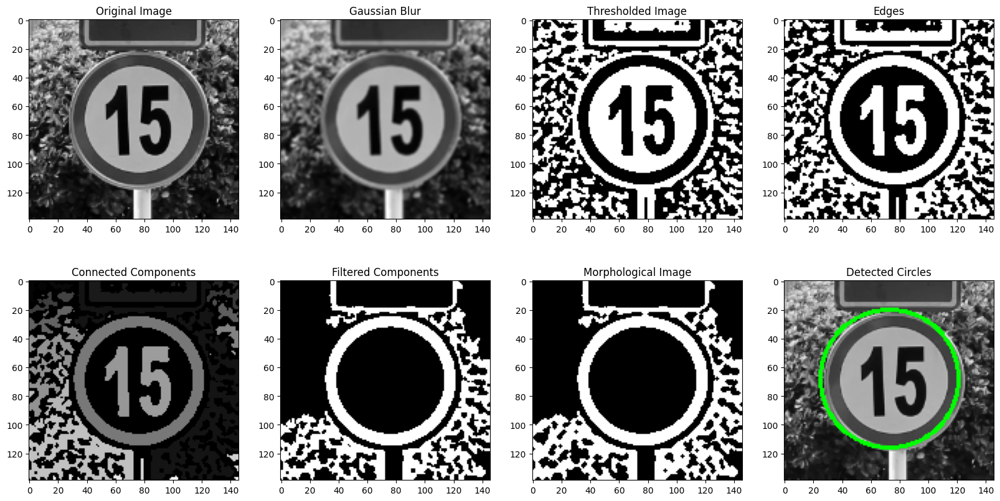

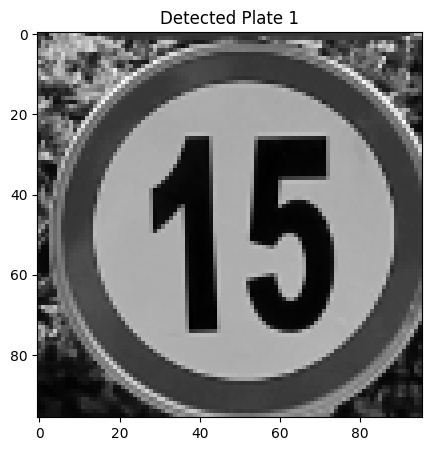

<Figure size 640x480 with 0 Axes>

In [39]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_easy_1.png")
detector.visualize_results()

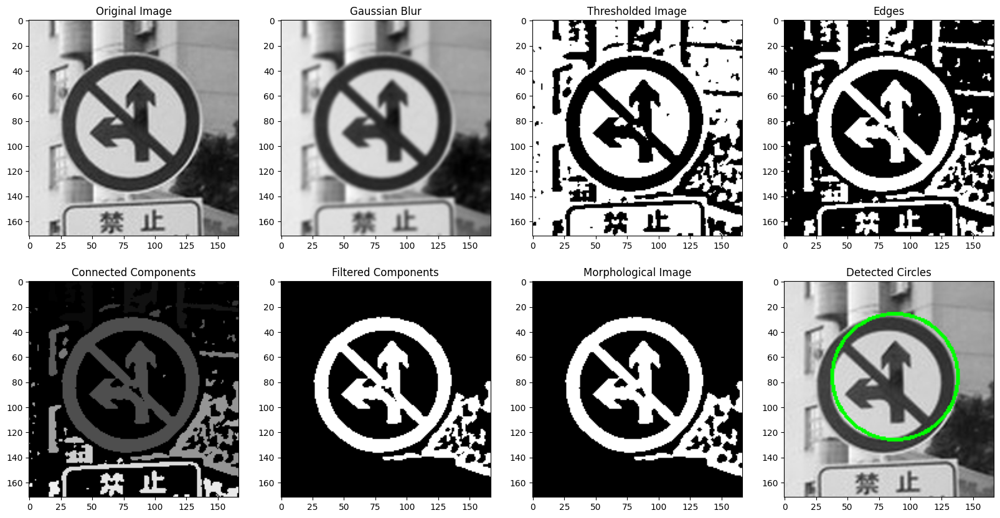

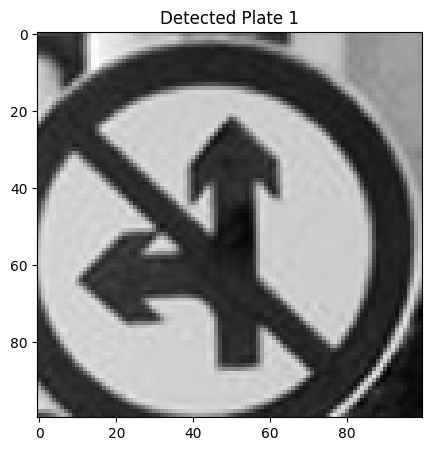

<Figure size 640x480 with 0 Axes>

In [40]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_easy_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


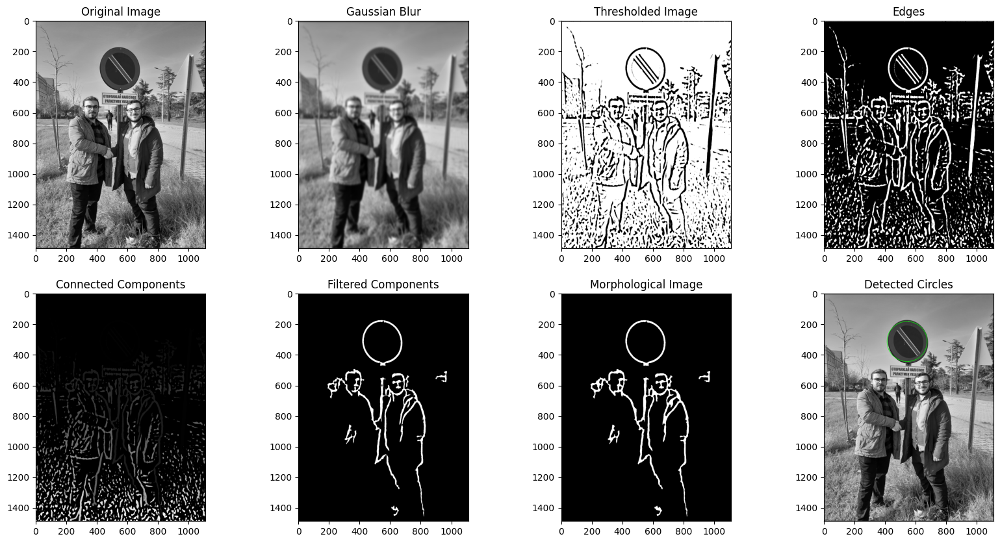

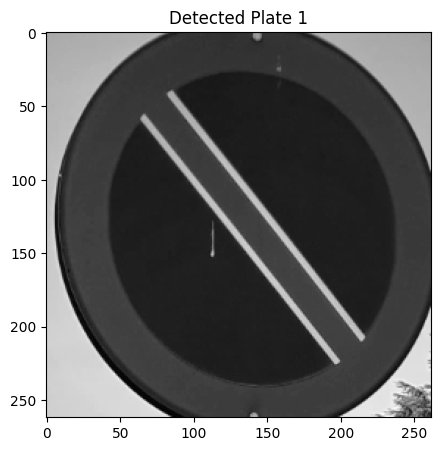

<Figure size 640x480 with 0 Axes>

In [41]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_middle_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


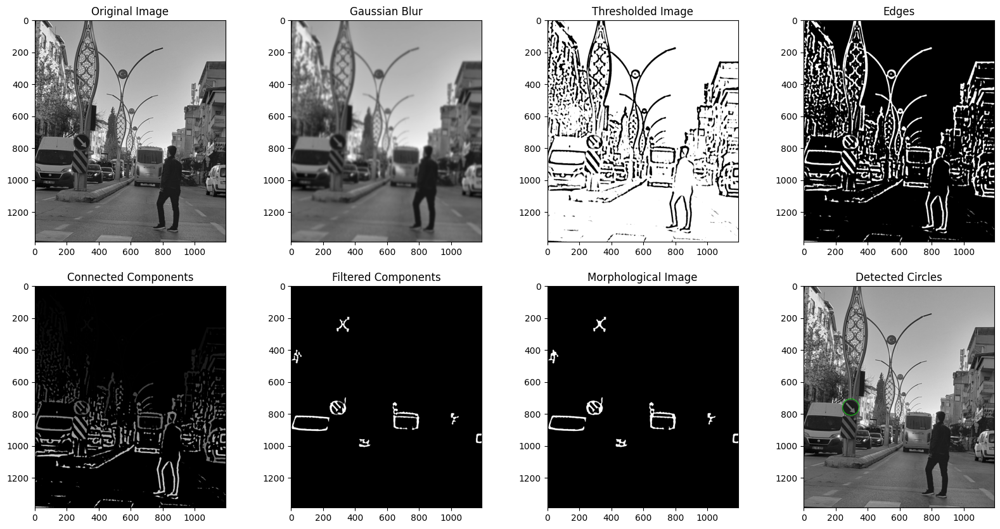

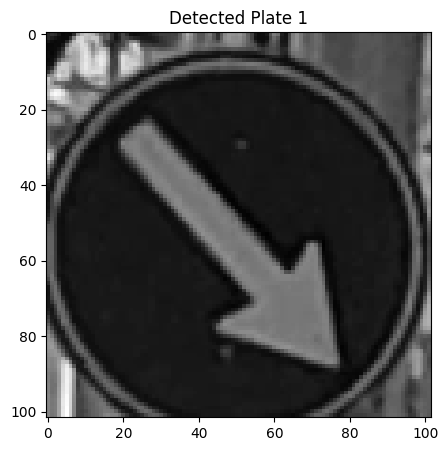

<Figure size 640x480 with 0 Axes>

In [42]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_hard_1.png")
detector.visualize_results()

# Test

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


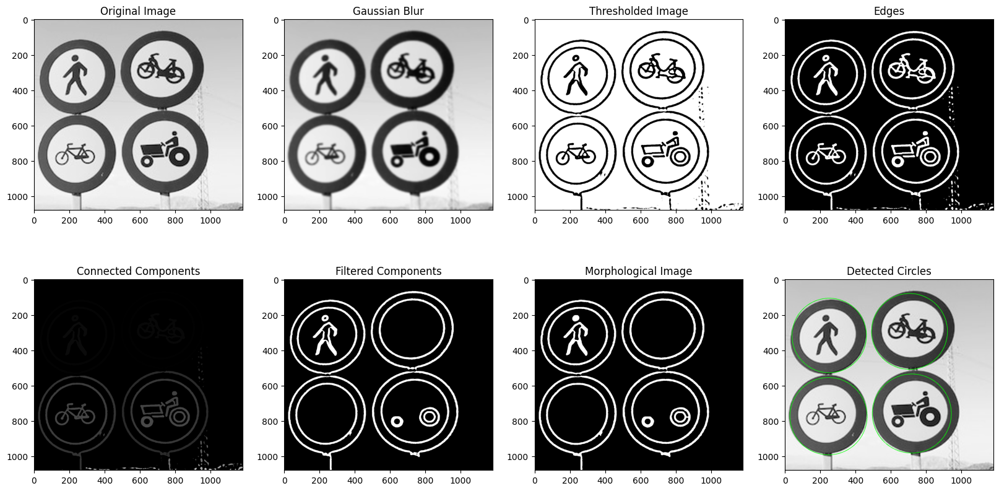

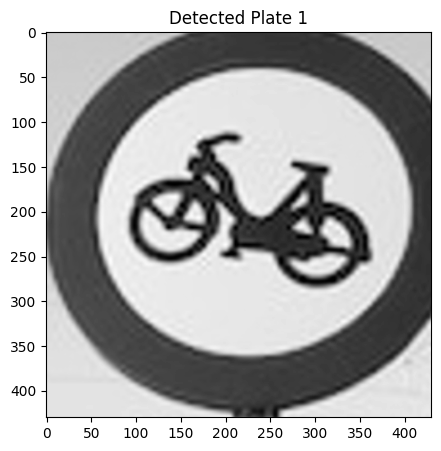

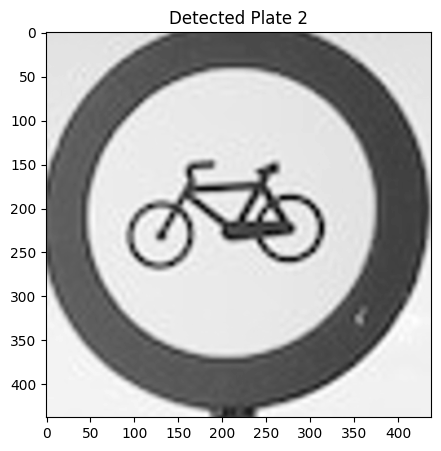

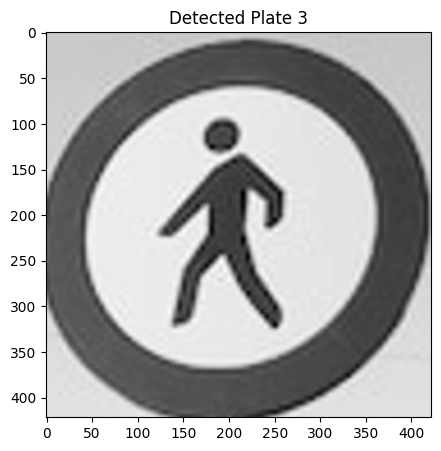

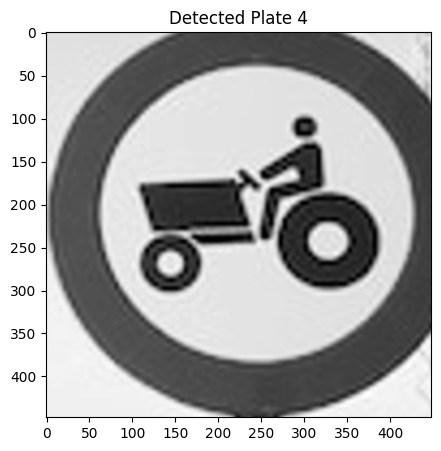

<Figure size 640x480 with 0 Axes>

In [43]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_easy_1.png")
detector.visualize_results()

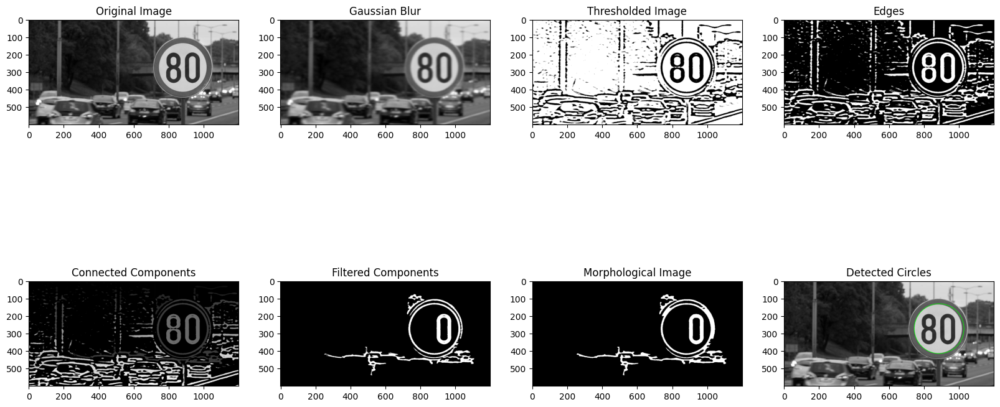

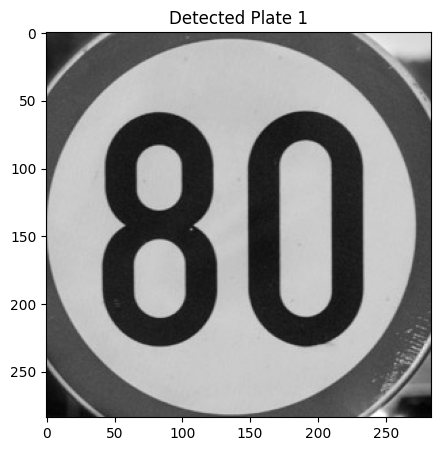

<Figure size 640x480 with 0 Axes>

In [44]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_middle_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


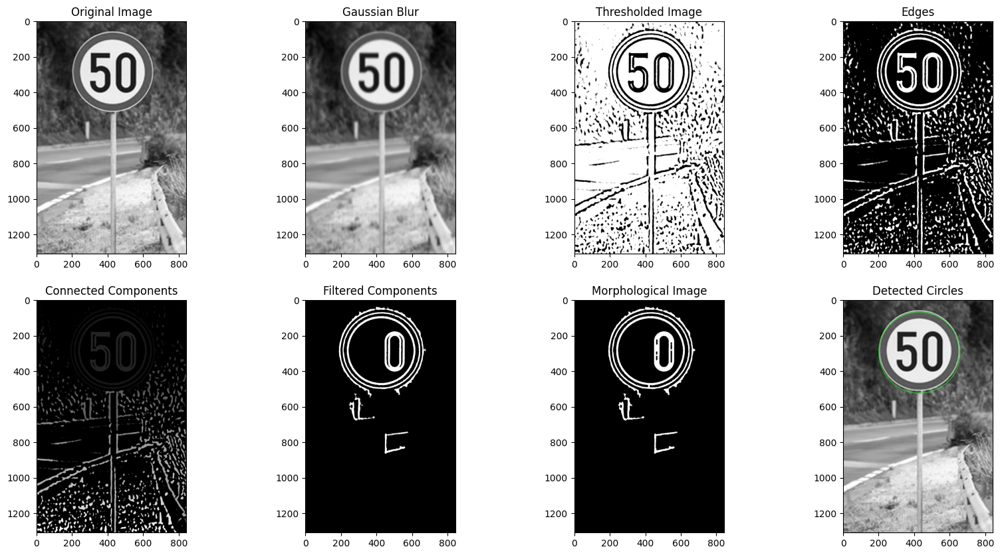

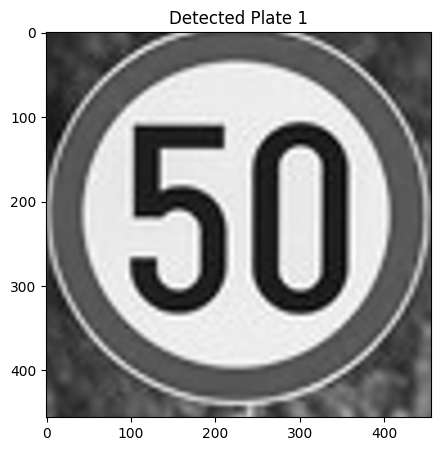

<Figure size 640x480 with 0 Axes>

In [45]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_middle_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


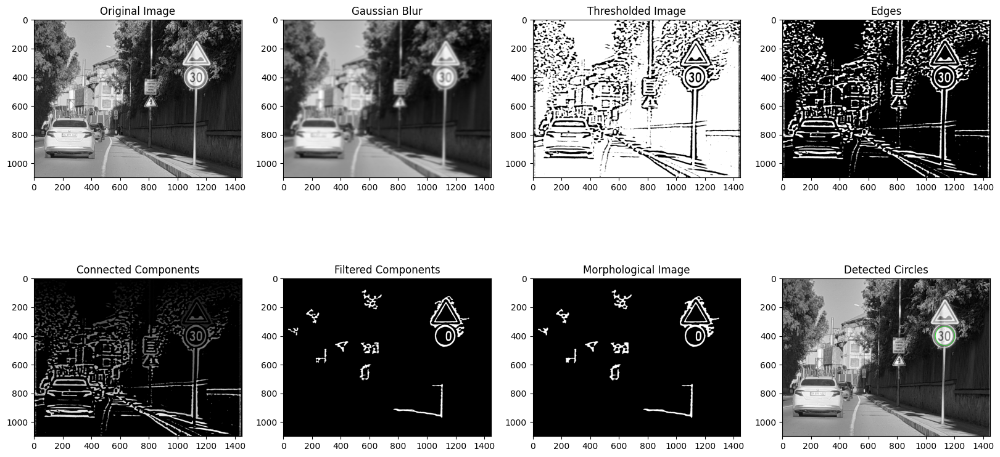

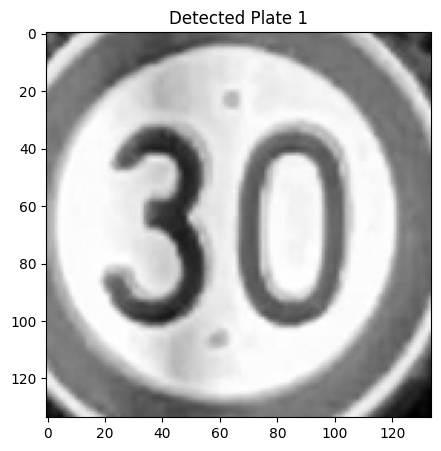

<Figure size 640x480 with 0 Axes>

In [46]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_hard_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


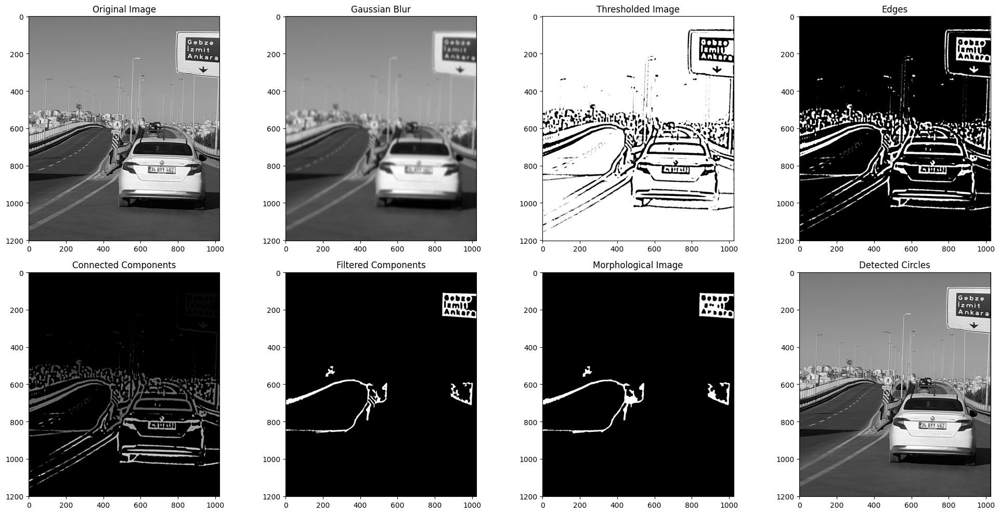

In [47]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_hard_2.png")
detector.visualize_results()

# All images

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


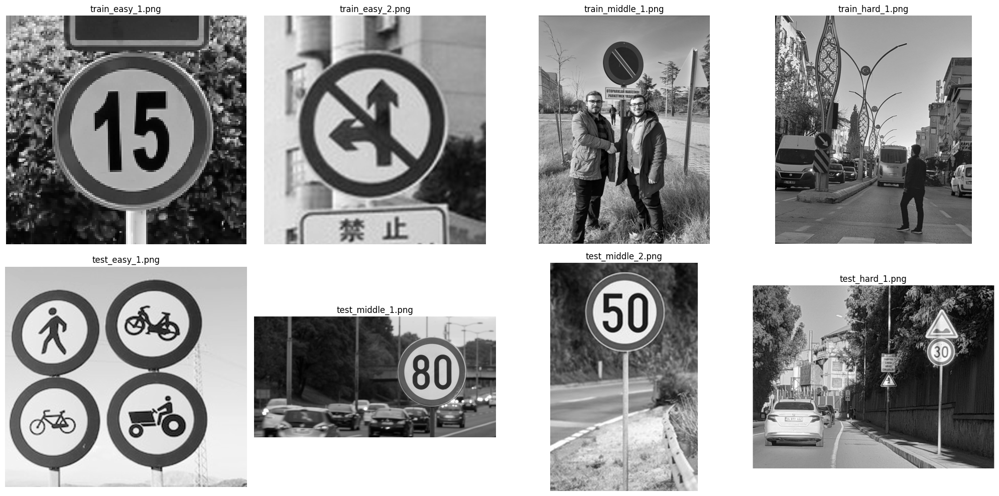

In [48]:
train_images_names = ["train_easy_1.png", "train_easy_2.png", "train_middle_1.png", "train_hard_1.png"]
test_images_names = ["test_easy_1.png", "test_middle_1.png", "test_middle_2.png", "test_hard_1.png"]

#read images
train_images = [cv2.imread(os.path.join("main_images_gray", "train", image_name), cv2.IMREAD_GRAYSCALE) for image_name in train_images_names]   
test_images = [cv2.imread(os.path.join("main_images_gray", "test", image_name), cv2.IMREAD_GRAYSCALE) for image_name in test_images_names]

#plot images
plt.figure(figsize=(20, 10))
for i, image in enumerate(train_images + test_images, 1):
    plt.subplot(2, 4, i)
    plt.imshow(image, cmap="gray")
    plt.axis("off")
for i, image_name in enumerate(train_images_names + test_images_names, 1):
    plt.subplot(2, 4, i)
    plt.title(image_name)
plt.tight_layout()
plt.show()


# All plates

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


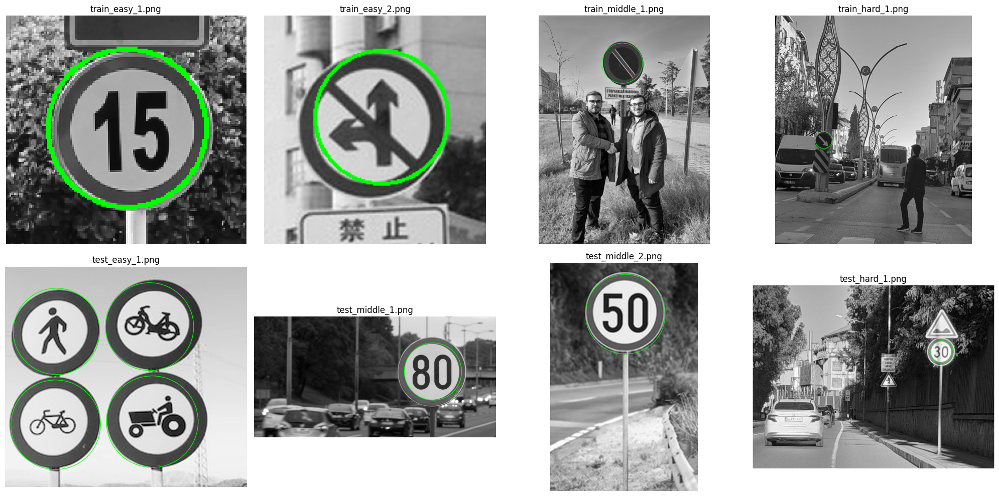

In [49]:
plt.figure(figsize=(20, 10))
# plot all the output images
for i, image_name in  enumerate(train_images_names + test_images_names, 1):
    detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train") if i <= len(train_images_names) \
    else TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
    detector.process_image(image_name)
    plt.subplot(2,4 , i)
    plt.imshow(detector.output_image, cmap="gray")
    plt.title(image_name)
    plt.axis("off")
plt.tight_layout()
    

# Some analysis

## Changing gaussian blur kernel size

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


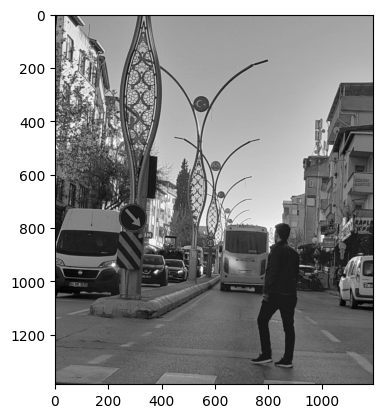

In [9]:
# read from the main_images_gray directory the image train_hard_1.png with cv2.imread
train_hard_1_image = cv2.imread("main_images_gray/train/train_hard_1.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(train_hard_1_image, cmap="gray")

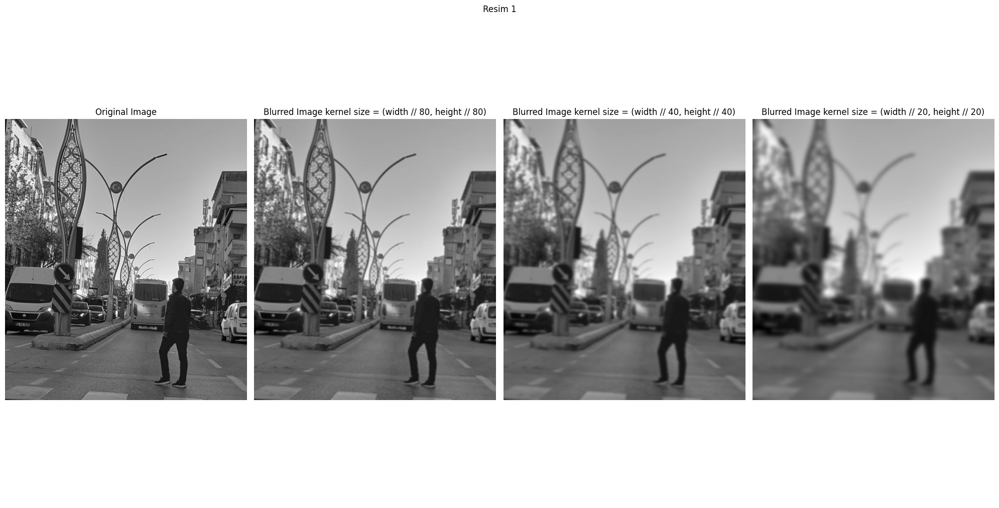

In [24]:
# gaussian blur with kernel_size = (self.width // 40, self.height // 40) and //20 and //80
kernel_size_40 = (train_hard_1_image.shape[0] // 40 | 1, train_hard_1_image.shape[1] // 40 | 1)
blurred_image_40 = cv2.GaussianBlur(train_hard_1_image, kernel_size_40, 0.)

kernel_size_20 = (train_hard_1_image.shape[0] // 20 | 1, train_hard_1_image.shape[1] // 20 | 1)
blurred_image_20 = cv2.GaussianBlur(train_hard_1_image, kernel_size_20, 0.)

kernel_size_80 = (train_hard_1_image.shape[0] // 80 | 1, train_hard_1_image.shape[1] // 80 | 1)
blurred_image_80 = cv2.GaussianBlur(train_hard_1_image, kernel_size_80, 0.)

plt.figure(figsize=(20, 10))
plt.title("Resim 1")
plt.axis("off")

plt.subplot(1, 4, 1)
plt.imshow(train_hard_1_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 4, 2)
plt.imshow(blurred_image_80, cmap="gray")
plt.title("Blurred Image kernel size = (width // 80, height // 80)")
plt.axis("off")
plt.subplot(1, 4, 3)
plt.imshow(blurred_image_40, cmap="gray")
plt.title("Blurred Image kernel size = (width // 40, height // 40)")
plt.axis("off")
plt.subplot(1, 4, 4)
plt.imshow(blurred_image_20, cmap="gray")
plt.title("Blurred Image kernel size = (width // 20, height // 20)")
plt.axis("off")
plt.tight_layout()
plt.axis("off")
plt.show()


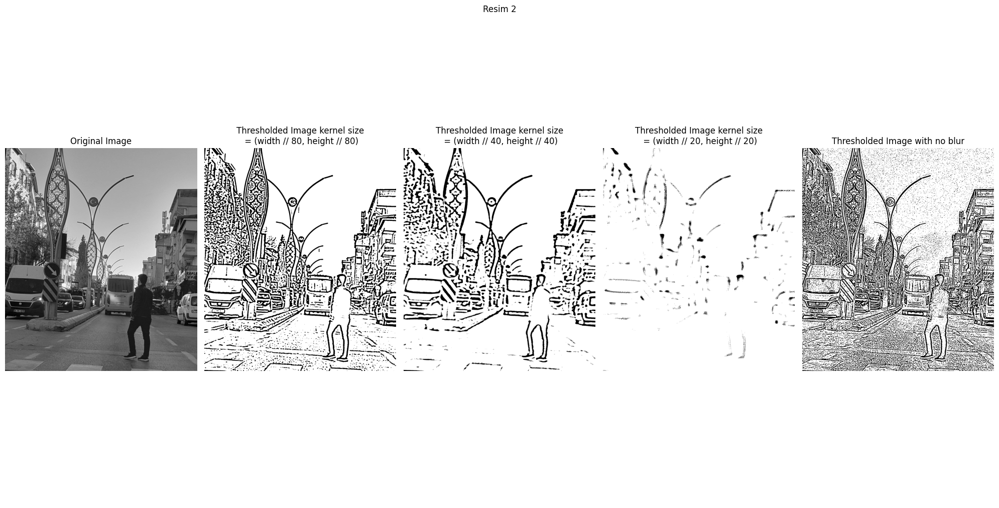

In [26]:
# thresholding with self.thresholded_image = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,19, 2) the 4 blurred images
thresholded_image_80 = cv2.adaptiveThreshold(blurred_image_80, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,19, 2)
thresholded_image_40 = cv2.adaptiveThreshold(blurred_image_40, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,19, 2)
thresholded_image_20 = cv2.adaptiveThreshold(blurred_image_20, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,19, 2)
thresholded_image = cv2.adaptiveThreshold(train_hard_1_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,19, 2)

plt.figure(figsize=(20, 10))
plt.title("Resim 2")
plt.axis("off")
plt.subplot(1, 5, 1)
plt.imshow(train_hard_1_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 5, 2)
plt.imshow(thresholded_image_80, cmap="gray")
plt.title("Thresholded Image kernel size\n = (width // 80, height // 80)")
plt.axis("off")
plt.subplot(1, 5, 3)
plt.imshow(thresholded_image_40, cmap="gray")
plt.title("Thresholded Image kernel size\n = (width // 40, height // 40)")
plt.axis("off")
plt.subplot(1, 5, 4)
plt.imshow(thresholded_image_20, cmap="gray")
plt.title("Thresholded Image kernel size\n = (width // 20, height // 20)")
plt.axis("off")
plt.subplot(1, 5, 5)
plt.imshow(thresholded_image, cmap="gray")
plt.title("Thresholded Image with no blur")
plt.axis("off")
plt.tight_layout()
plt.show()